In [1]:
from manipulation_library import * 
from glob import glob 
## load the SAM model
mask_generator = load_sam_model()
path_to_folder = "/".join(os.getcwd().split("/")[:-1])


CUDA is available!


In [2]:
## this is for renaming the files , keep commented just in case 

# folder_path = "/Users/barradd/Documents/GitHub/Coral_project/input/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/"
# folder_files = [ x for x in glob(f"{folder_path}/*jpg")]
# for name in folder_files:
#     new_name =  name.replace(' ','')
#     os.rename(name, new_name)

In [3]:
# path_to_folder = "/".join(os.getcwd().split("/")[:-1])
path_to_image = "input/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/T2_BMC_Night-4.jpg"
path_absolute_to_image = os.path.join(path_to_folder,path_to_image)
# image = get_image(path_absolute_to_image)
image = cv2.imread(path_absolute_to_image)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
# image = cv2.resize(image, (1200,800), interpolation = cv2.INTER_AREA)

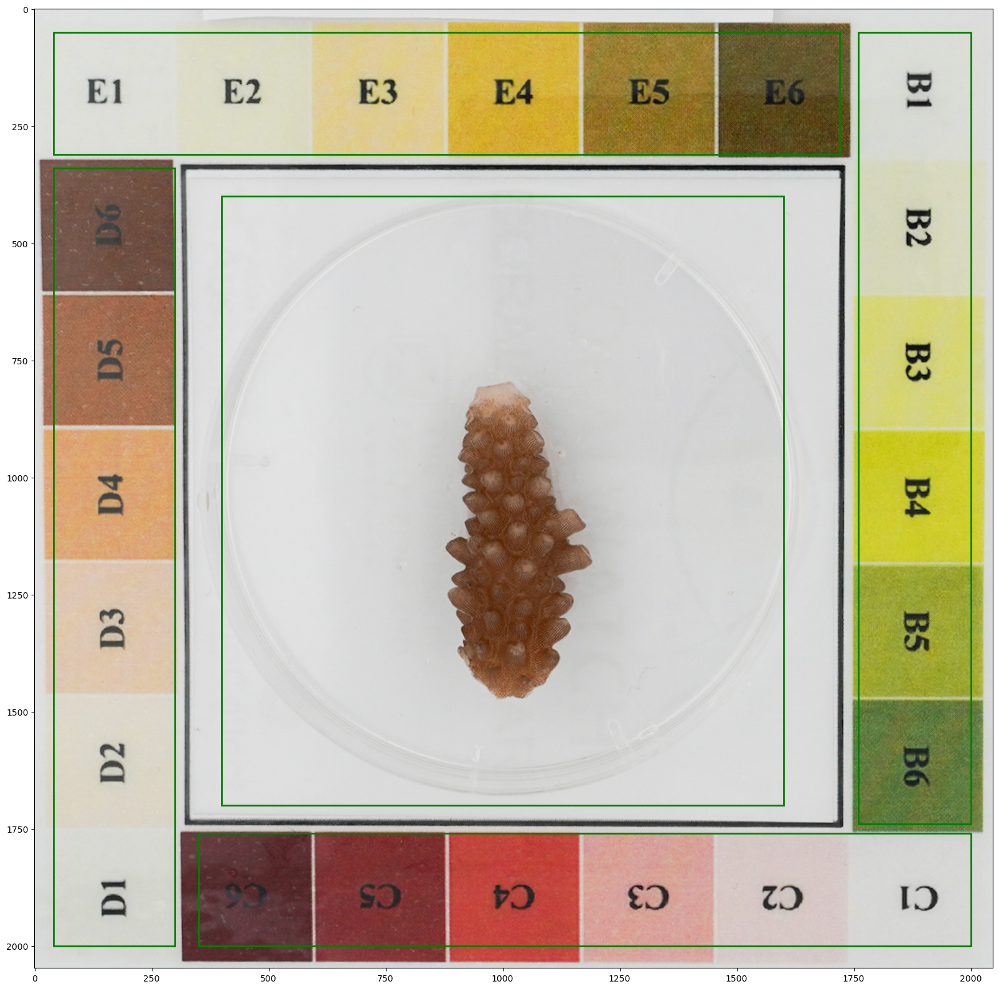

In [4]:
# central 
input_box = np.array([400,400,1600,1700]) ## x , y , x, y

#lateral
input_box_2 = np.array([40,340,300,2000])
input_box_3 = np.array([1760,50,2000,1740])


# horizontal
input_box_4 = np.array([ 40,50,1720,310])
input_box_5 = np.array([350,1760,2000,2000])


plt.figure(figsize=(20, 20))
plt.imshow(image)
# show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
show_box(input_box_2, plt.gca() )
show_box(input_box_3, plt.gca() )
show_box(input_box_4, plt.gca() )
show_box(input_box_5, plt.gca() )


plt.axis('on')
plt.show()

In [22]:
boxes = {"center" : np.array([400,400,1600,1700]), ## x , y , x, y
#lateral
"left" : np.array([40,340,300,2000]),
"rigth" : np.array([1760,50,2000,1740]),
# horizontal
"up" :np.array([ 40,50,1720,310]),
"down" : np.array([350,1760,2000,2000])
}

In [23]:
def save_my_masked_image(list_of_images,name):
    for i,image in enumerate (list_of_images):
        filename = os.path.join(path_absolute_to_output,f"{name}_{str(i)}.jpg")
        # image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        cv2.imwrite(filename, image)

In [24]:
def crop_my_image(image,tag):
    ### this looks like it can include the mayority of the section we want to analyze
    x, y, width, height =  boxes[tag]
    cropped_image = image[y:height,x:width]
    
    # cropped_image = image[int(y):int(height),int(x):int(width)]
    return cropped_image

In [29]:
path_to_folder = "/".join(os.getcwd().split("/")[:-1])

images = "input/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/"
outputs = "output/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/cropped_images"

path_absolute_to_image = os.path.join(path_to_folder,images)
path_absolute_to_output = os.path.join(path_to_folder,outputs)

os.makedirs(path_absolute_to_output ,exist_ok=True)
# all_images = [ os.path.join(path_absolute_to_image,image) for image in os.listdir (path_absolute_to_image) ]
all_images = [ x for x in glob(f"{path_absolute_to_image}/*jpg")]
all_images[0:3]

['/Users/barradd/Documents/GitHub/Coral_project/input/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/T0_BMC_Night-3.jpg',
 '/Users/barradd/Documents/GitHub/Coral_project/input/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/T2_CTRL_Day-6.jpg',
 '/Users/barradd/Documents/GitHub/Coral_project/input/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/T0_BMC_Night-2.jpg']

In [30]:
for im in all_images: 
    # print (im)
    local_image = cv2.imread(im)
    # local_image = cv2.cvtColor(local_image, cv2.COLOR_BGR2RGB)

    for t in ["up","down","left","rigth","center"]:
        name = im.split("/")[-1].split(".")[0]
        name = f"{name}-{t}.jpeg"
        path_name = os.path.join(path_absolute_to_output,name)
        # print (path_name)

        if t == "down":
            cropped_image = crop_my_image(image=local_image,tag=t)
            cropped_image = cv2.rotate(cropped_image, cv2.ROTATE_180  ) 
            cv2.imwrite(path_name, cropped_image)
        elif t == "left":
            cropped_image = crop_my_image(image=local_image,tag=t)
            cropped_image = cv2.rotate(cropped_image, cv2.ROTATE_90_CLOCKWISE ) 
            cv2.imwrite(path_name, cropped_image)
        elif t == "rigth":
            cropped_image = crop_my_image(image=local_image,tag=t)
            cropped_image = cv2.rotate(cropped_image, cv2.ROTATE_90_COUNTERCLOCKWISE ) 
            cv2.imwrite(path_name, cropped_image)
        else:
            cropped_image = crop_my_image(image=local_image,tag=t)
            cv2.imwrite(path_name, cropped_image)


In [31]:
only_center_images = f"{path_absolute_to_output}/*center*"
list_of_center_image = glob(only_center_images)
list_of_center_image[0:3]

['/Users/barradd/Documents/GitHub/Coral_project/output/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/cropped_images/T1_BMC_Night-1-center.jpeg',
 '/Users/barradd/Documents/GitHub/Coral_project/output/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/cropped_images/T1_CTRL_Night-1-center.jpeg',
 '/Users/barradd/Documents/GitHub/Coral_project/output/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/cropped_images/T0_BMC_Day-6-center.jpeg']

In [32]:
%%time
for im in list_of_center_image: 
    print (im)
    local_image = cv2.imread(im)
    # local_image = cv2.cvtColor(local_image, cv2.COLOR_BGR2RGB)
    name = im.split("/")[-1]
    masks = mask_generator.generate(local_image)
    list_of_images, titles  = process_images(image = local_image, masks= masks)
    # show_images_grid( images=list_of_images[2:-2] , titles=titles[2:-2] )
    save_my_masked_image(list_of_images=list_of_images,name=name)
    # save_my_masked_image(list_of_images=list_of_images[2:-3],name=name)

/Users/barradd/Documents/GitHub/Coral_project/output/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/cropped_images/T1_BMC_Night-1-center.jpeg
/Users/barradd/Documents/GitHub/Coral_project/output/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/cropped_images/T1_CTRL_Night-1-center.jpeg
/Users/barradd/Documents/GitHub/Coral_project/output/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/cropped_images/T0_BMC_Day-6-center.jpeg
/Users/barradd/Documents/GitHub/Coral_project/output/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/cropped_images/T2_BMC_Day-3-center.jpeg
/Users/barradd/Documents/GitHub/Coral_project/output/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/cropped_images/T0_CTRL_Night-2-center.jpeg
/Users/barradd/Documents/GitHub/Coral_project/output/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/cropped_images/T1_CTRL_Day-1-center.jpeg
/Users/barradd/Documents/GitHub/Coral_project/output/Fragments_CoralChart

# Maybe start a new notebook from here

In [33]:

from manipulation_library_dev import plot_compare_mapped_image_save, get_image, get_colors, OcrAnalysis 
import easyocr , os , ssl
import matplotlib.pyplot as plt
import numpy as np
ssl._create_default_https_context = ssl._create_unverified_context

In [34]:
reader = easyocr.Reader(['en'],gpu=False) # this needs to run only once to load the model into memory

Using CPU. Note: This module is much faster with a GPU.


In [35]:
# 2nd Gather all the cropped parts from the images 

# %%
path_to_folder = "/".join(os.getcwd().split("/")[:-1])

segment_enhanced = "output/Fragments_CoralChart/Dispenser_Project_Fragments_CoralChart/cropped_images/center_fragment"
path_absolute_to_image = os.path.join(path_to_folder,segment_enhanced)
segment_center_images = f"{path_absolute_to_image}/*.jpg"
list_of_center_segment_images_enhanced = glob(segment_center_images)

file_name = [ x.split("/")[-1].split("-center")[0] for x in list_of_center_segment_images_enhanced ]

my_path = "output/Enhanced_Images_Dispenser_ImagingPAM_Fragments"
path_to_images_folder = os.path.join(path_to_folder,my_path)
section = ["up","down","rigth","left"]
my_images ={}
for f_name in file_name:
    inner_dict = {} 
    for sec in section :
        image_path = os.path.join(path_to_images_folder, sec, f"{f_name}-{sec}.jpeg")
        if os.path.isfile( image_path): 
            inner_dict[sec] = image_path
        else : 
            print (f"file not found :{path_to_images_folder}/{sec}/{f_name}-{sec}.jpeg")
    if inner_dict :
         my_images[f_name] = inner_dict

In [36]:
# %% [markdown]
# Build the color chart 
# %%
custom_color_charts = {}
incomplete_to_fill = []
for f_name in file_name:
        my_personal_chart = {}
        # print(f_name)

        for sec in section :
            im =  my_images[f_name][sec]
            # print(im)
            result = reader.readtext(im)
            bboxes, text_list = OcrAnalysis.get_bounding_boxes(result)

            #if len(text_list) == 6 :
                #print(f_name,sec,len(text_list))

            image = get_image(im)

            for t,bbox in zip(text_list,bboxes):
                cropped_image = OcrAnalysis.get_pixels_above_bbox(bbox=bbox,image=image)
                df_color = get_colors(image=cropped_image, number_of_colors=1, show_chart=False)
                my_personal_chart[t]=tuple( round(x) for x in df_color["rgb_colors"][0].tolist() )

        if my_personal_chart:

            new_keys = ['E1', 'E2', 'E3', 'E4', 'E5', 'E6', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6']
            if len(new_keys) == len(my_personal_chart.keys()):
                my_personal_chart = {new_keys[i]: my_personal_chart[old_key] for i, old_key in enumerate(my_personal_chart)}
                my_personal_chart["Black"] = tuple([0,0,0])
                my_personal_chart["White"] = tuple([255,255,255])
                custom_color_charts[f_name] = my_personal_chart
            else :
                #print (f"not complete:{f_name}")
                incomplete_to_fill.append(f_name)


: 

In [ ]:
# %%
my_custom_keys = [x for x in custom_color_charts.keys()]
for idx , f_name in enumerate (incomplete_to_fill):
    r_name = my_custom_keys[idx]
    print (f"filling {f_name} with {r_name}" )
#    #del custom_color_charts[f_name]
    custom_color_charts[f_name] ={ key:item for (key,item) in custom_color_charts[r_name].items()}

In [24]:
# %%
for im in list_of_center_segment_images_enhanced: 
    # print (im)
    # local_image = get_image(im)
    name = im.split("/")[-1]
    key = im.split("/")[-1].split("-center")[0]
    if key in custom_color_charts.keys():
        if len(custom_color_charts[key]) == 26:
            pass
        else:
            print (key,len(custom_color_charts[key]))

'/home/barradd/Documents/GitHub/Coral_project/output/Test-enhanced-Images/Enhanced_images/mapped_color_images'

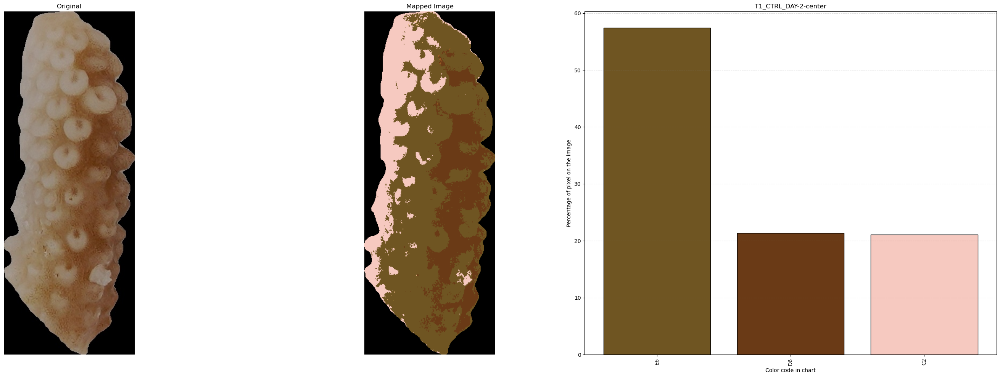

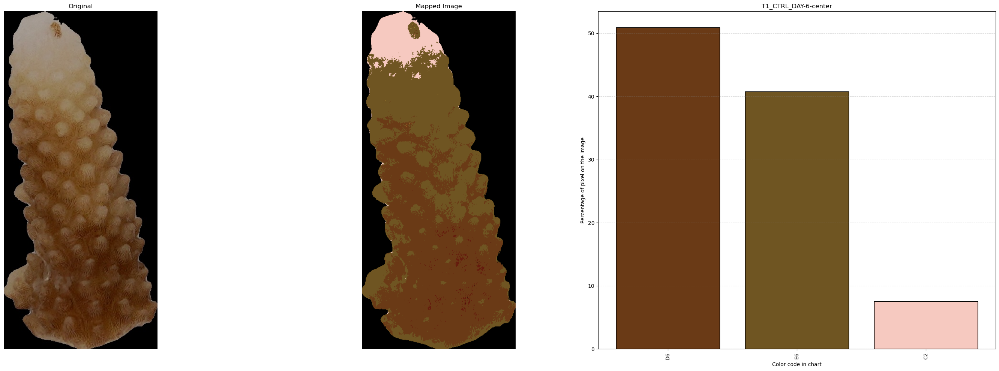

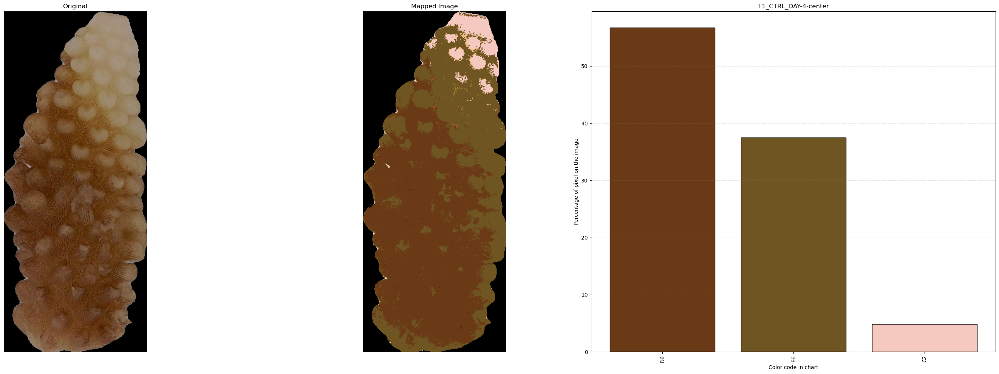

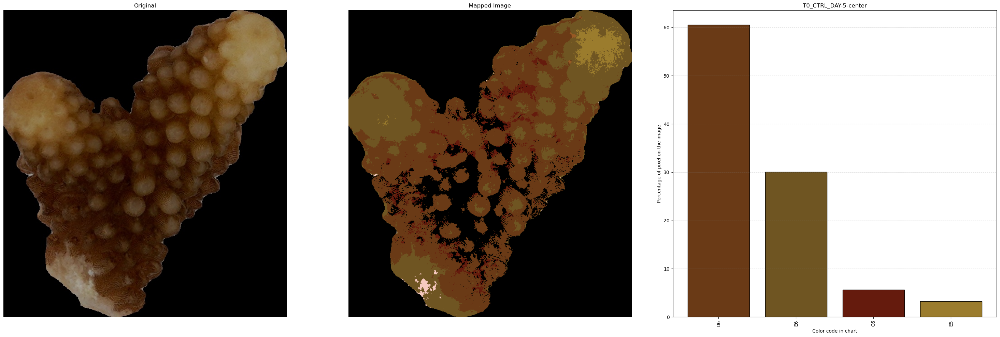

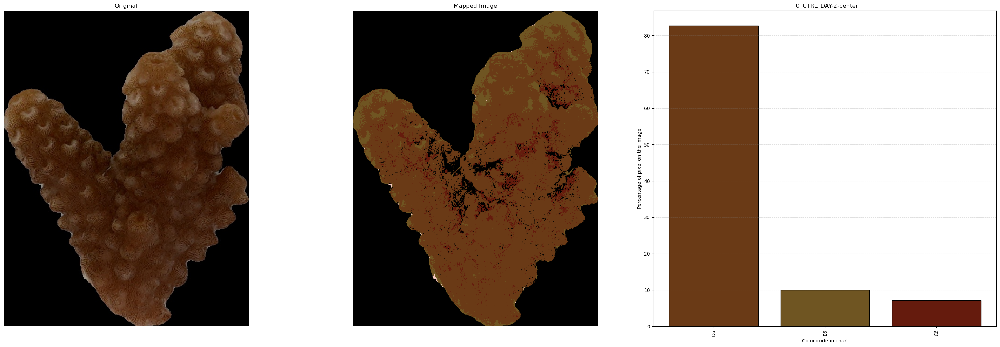

...

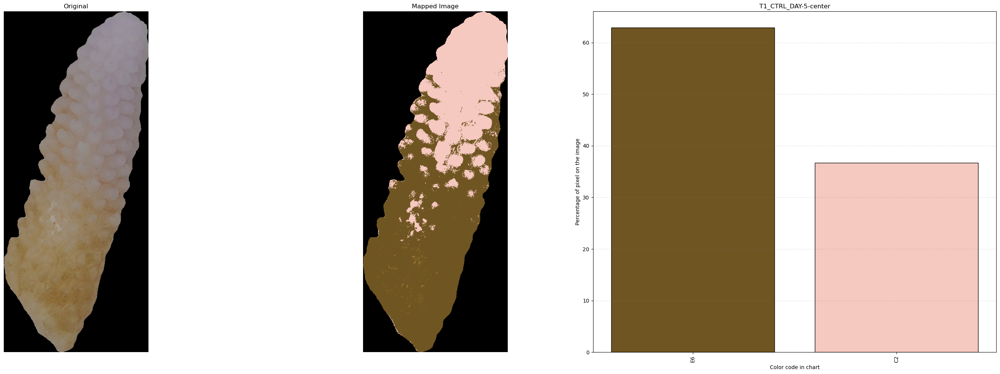

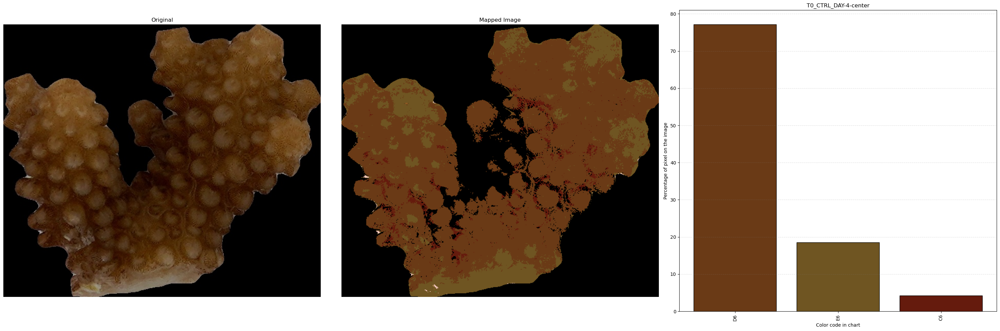

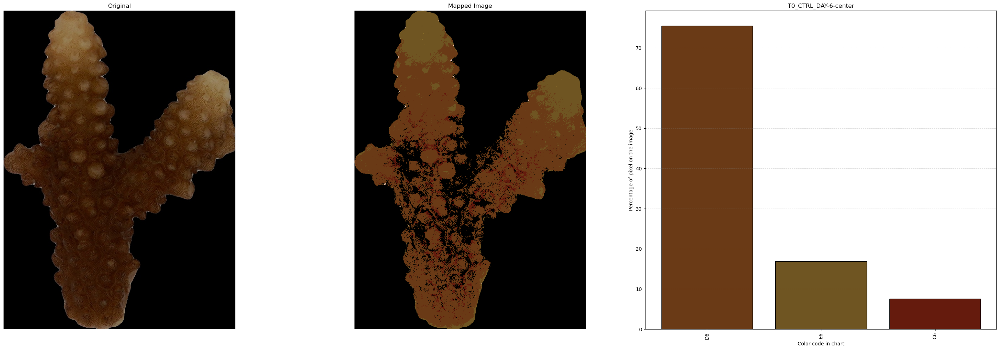

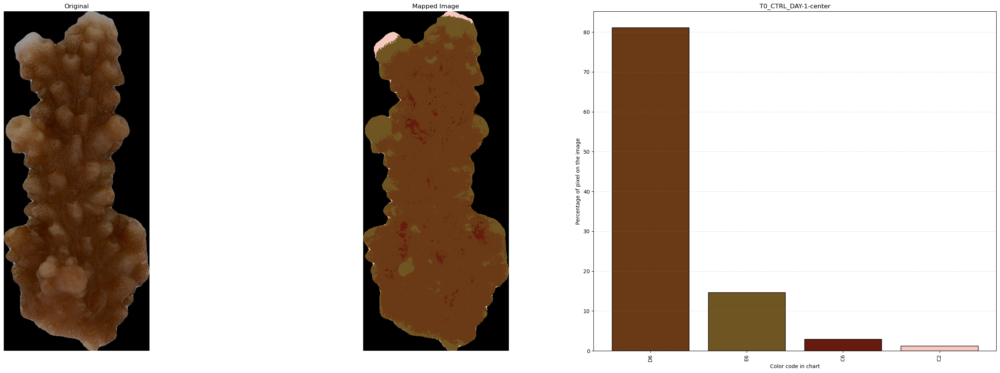

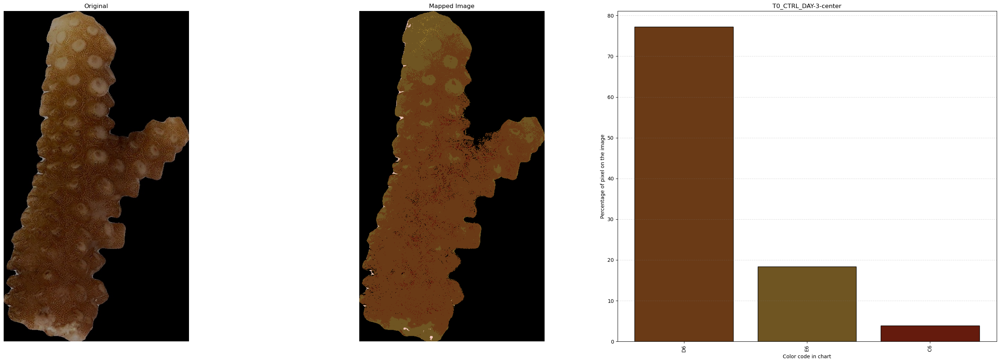